In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import scipy as sp
def figsize(width, ratio):
    width /= 25.4
    height = width / ratio
    return (width, height)

fig16by9 = figsize(200, 16/9)

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = ['Times New Roman', 'Helvetica', 'serif']

plt.rcParams['font.size'] = 11
plt.rcParams['figure.figsize'] = fig16by9
plt.rcParams['figure.dpi'] = 350

plt.rcParams['lines.linewidth'] = .9

In [2]:
def g_(a, t1, t2):
    return lambda t: np.piecewise(t,
    [t > t2, t <= t2, t < t1],
    [0, a, 0]                    
    )

g = g_(1, 2, 3)

def xi(t):
    return np.random.uniform(-1, 1, size=t.size)

def wave(t, d):
    return np.sin(d*t)

def noisy_signal(t, b, c, d):
    return g(t) + b*xi(t) + c*wave(t, d)

## 1.1

In [3]:
N = 2**10 * 4
t = np.linspace(0.5, 4.5, N)
signal = noisy_signal(t, 1, 0, 1)
clean_signal = g(t)

In [4]:
W_tf = lambda num, den: (num, den)
W1_tf = lambda T: W_tf([1], [T, 1])

# передаточная функция от произвольного аргумента
def W_poly(W):
    return lambda p: sum(p**i*coef for i, coef in enumerate(reversed(W[0]))) / sum(p**i*coef for i, coef in enumerate(reversed(W[1])))

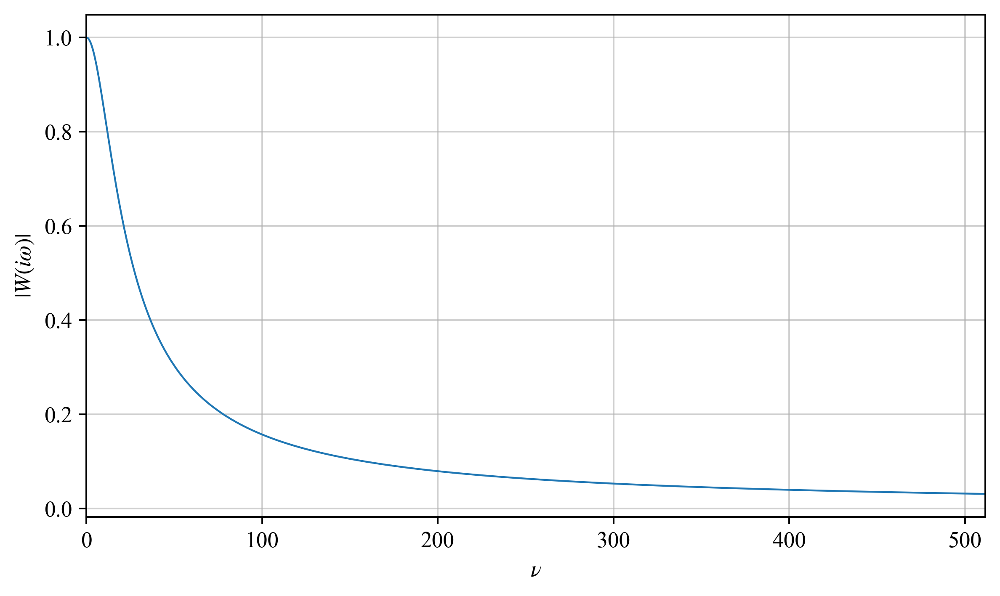

In [5]:
# АЧХ
def freq_response(W, t):
    poly = W_poly(W)

    sr = t[1] - t[0]
    N = t.size

    fr = np.fft.fftfreq(N, sr)
    fr = np.fft.fftshift(fr)

    return fr, np.abs(poly(1j*np.pi*2*fr))


#график АЧХ
def plot_freq_response(W, ax, t):  
    fr, response = freq_response(W, t)

    ax.set_xlabel('$\\nu$')
    ax.set_ylabel('$|W(i\\omega)|$')
    ax.plot(fr, response)

    plt.grid(which='major', linestyle='-', alpha=0.6)
    ax.set_xlim(left=0, right=fr[-1])

plot_freq_response(W1_tf(.01), plt.axes(), t)

In [6]:
# фильтрация через произведение перед. функции на образ
def apply_W_nondynamic(t, signal, W, dt=None) -> np.ndarray:
    if dt is None:
        dt = t[1] - t[0]

    fr = np.fft.fftfreq(signal.size, dt)
    fft = np.fft.fft(signal)

    return np.real(np.fft.ifft( W_poly(W)(1j*2*np.pi*fr)*fft ))

# честная динамическая фильтрация дискретного сигнала
def apply_W_dynamic(t, signal, W, dt=None, y0=0) -> np.ndarray:
    if dt is None:
        dt = t[1] - t[0]

    signal -= y0

    tf = sp.signal.TransferFunction(*W)
    t_out, y_out, _ = sp.signal.lsim(tf, U=signal, T=t)

    return y_out + y0


## Вариация параметра T

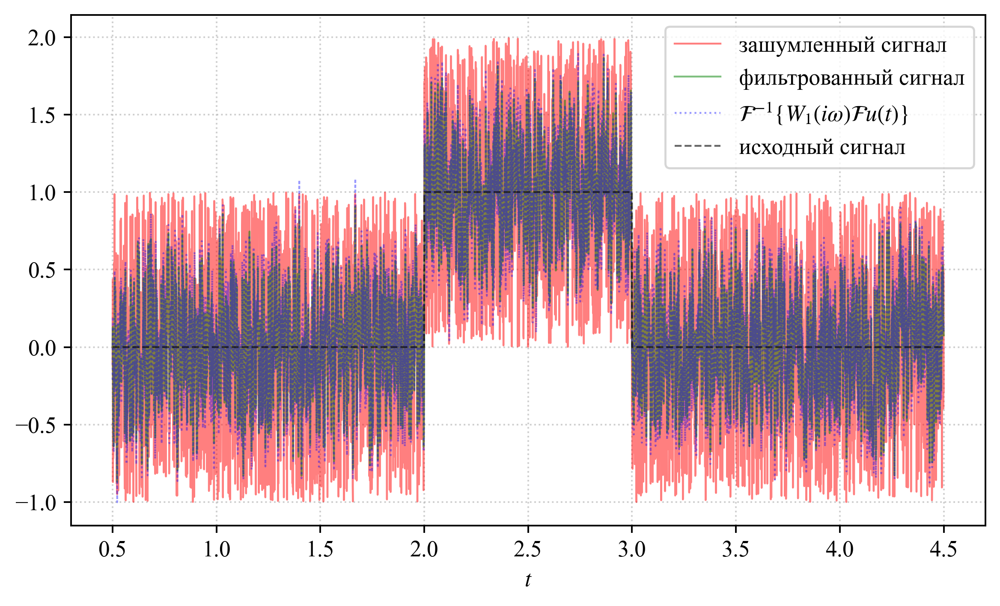

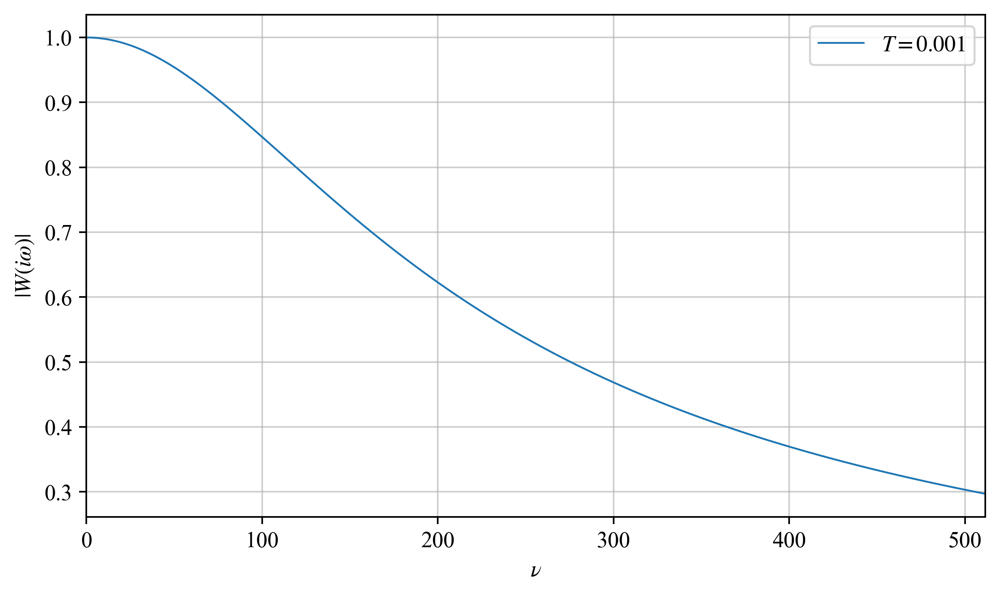

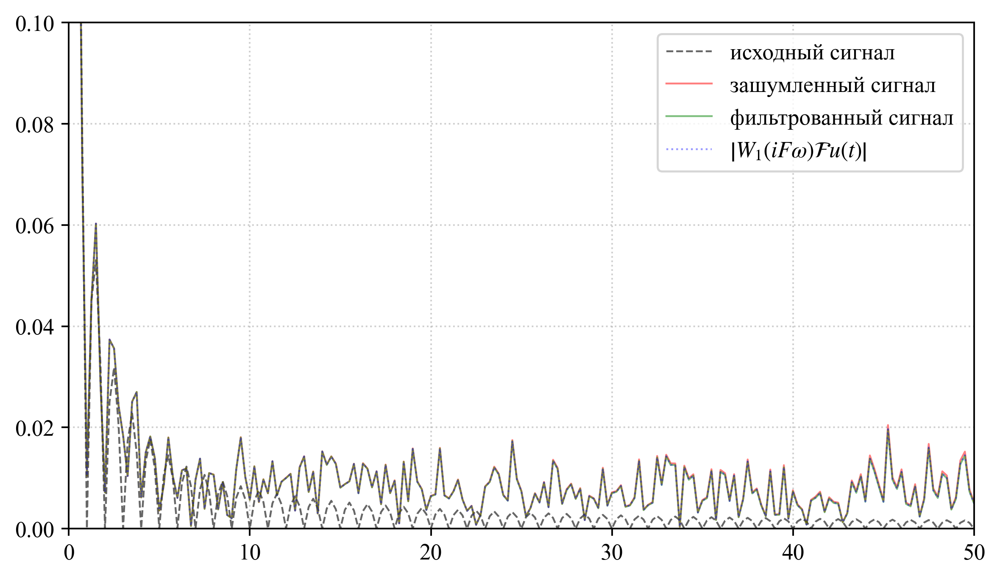

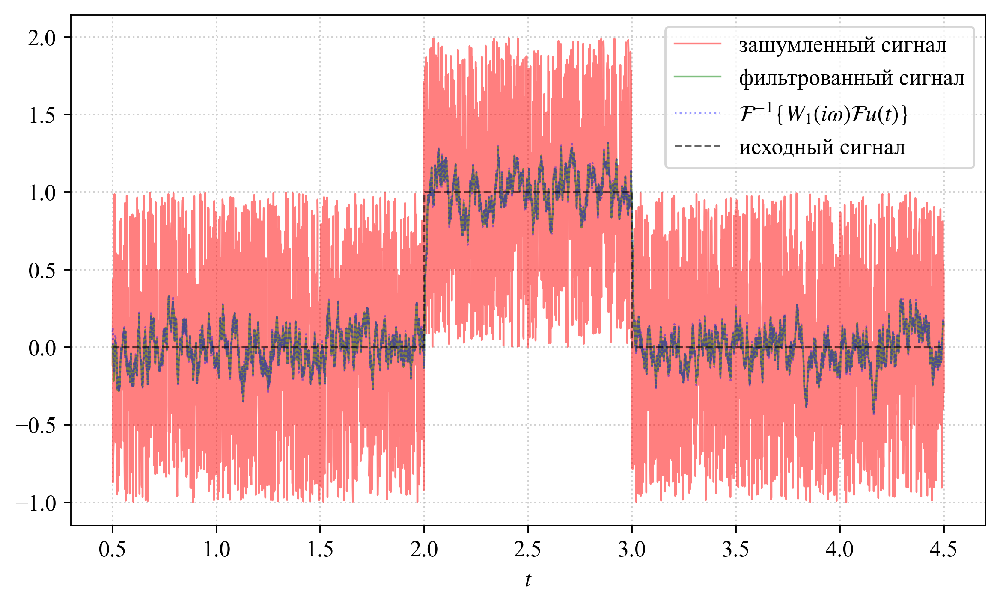

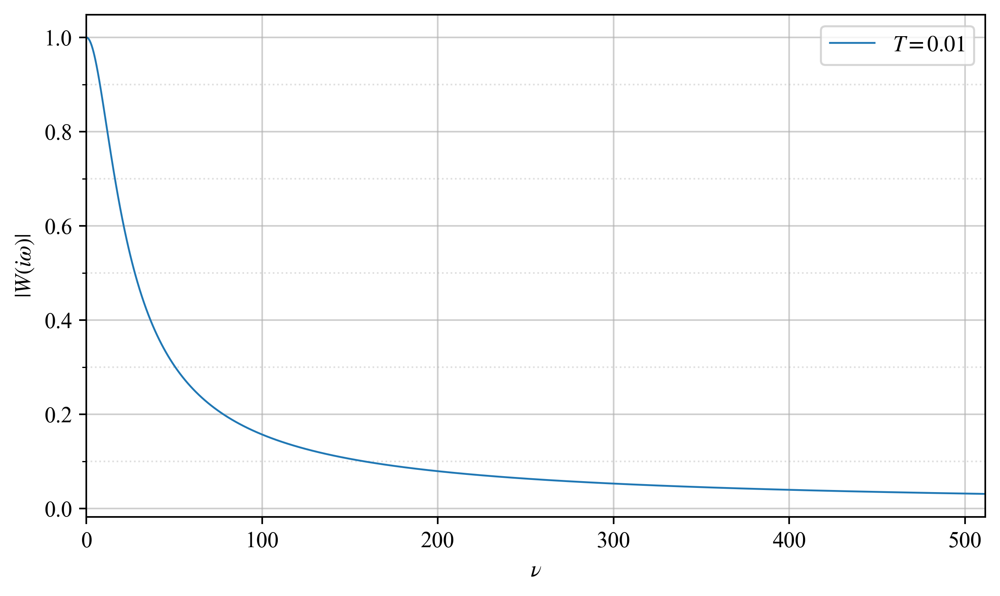

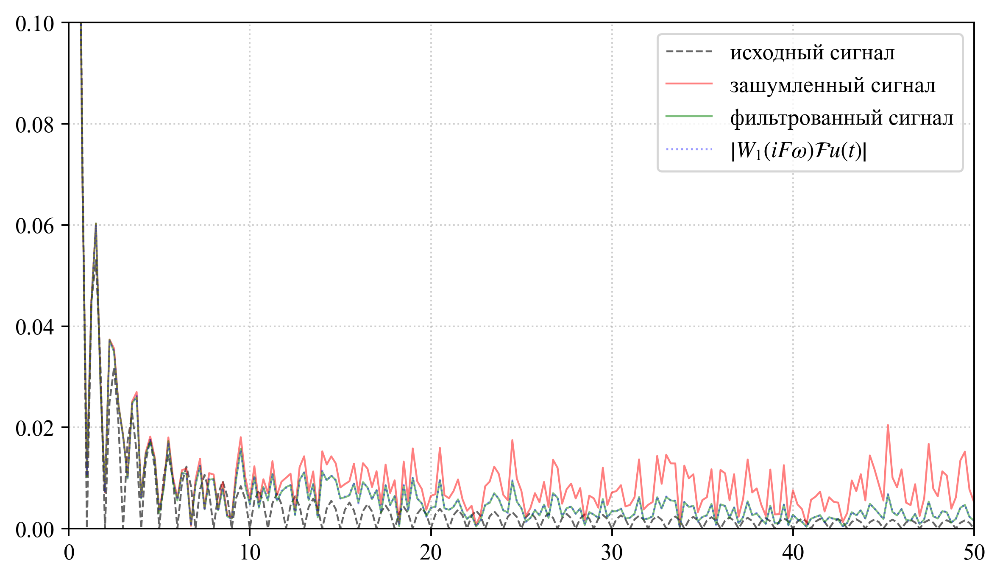

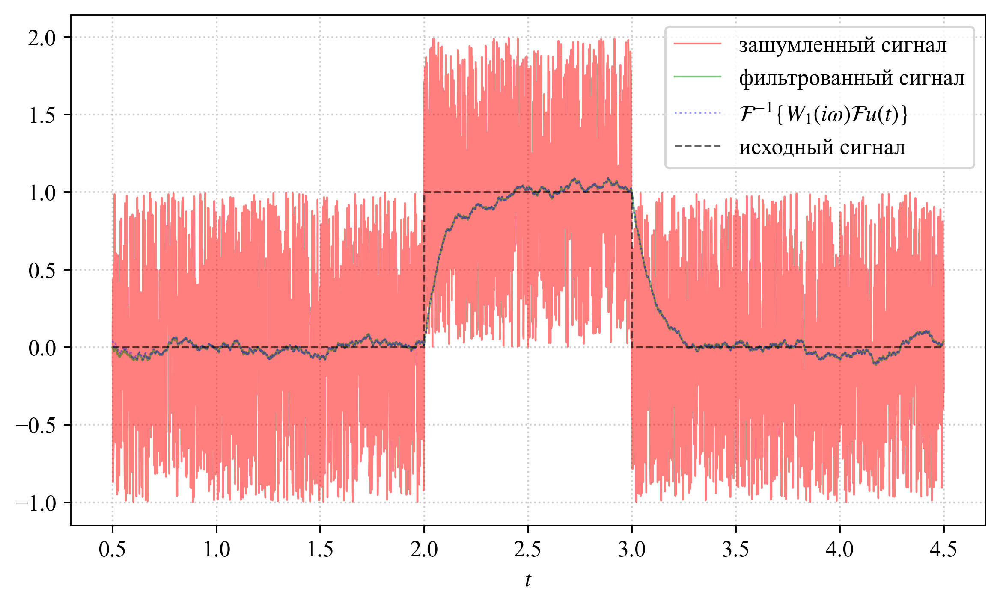

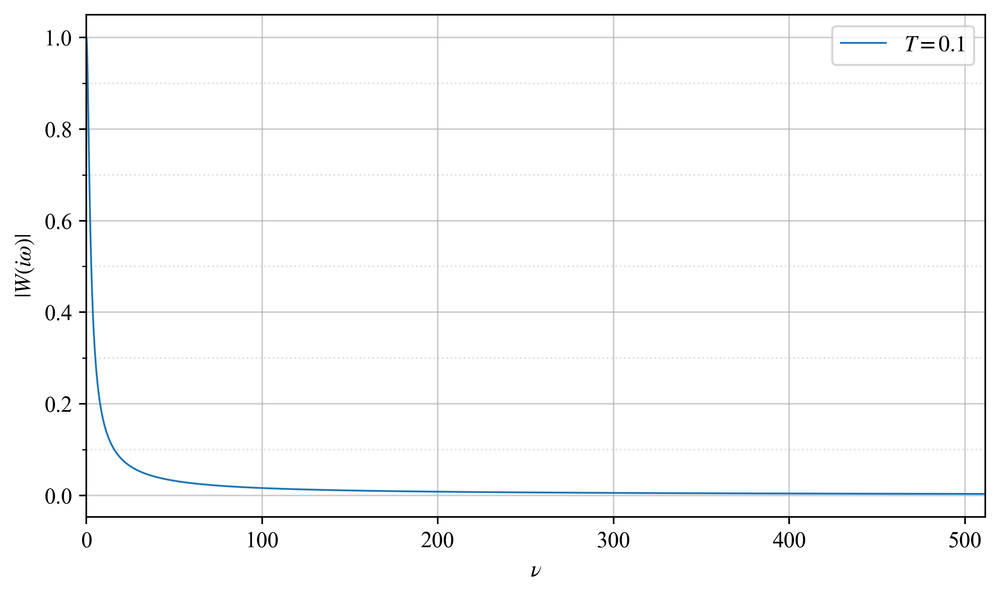

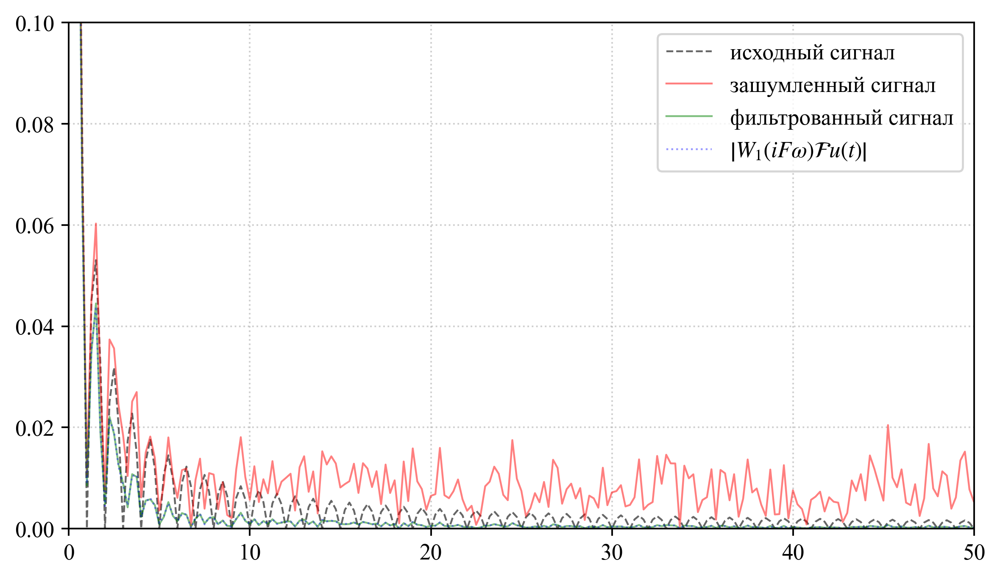

In [7]:
%mkdir -p ../fig/1/1/T/func
%mkdir -p ../fig/1/1/T/fr
%mkdir -p ../fig/1/1/T/conv

for i, N in enumerate((1e-3, 1e-2, 1e-1)):
    # =======================
    # Сравненение результатов
    # =======================
    plt.figure()

    filtered_fft_dyn = apply_W_dynamic(t, signal, W1_tf(N))
    out2 = apply_W_nondynamic(t, signal, W1_tf(N))

    plt.plot(t, signal, 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(t, filtered_fft_dyn, 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(t, out2, 'b:', alpha=.4, label="$\\mathcal{F}^{-1}\\{W_{1}(i \\omega)\\mathcal{F}u(t)\\}$")
    plt.plot(t, clean_signal, 'k--', alpha=.6, label='исходный сигнал')
    plt.legend()

    plt.xlabel('$t$')
    plt.grid(which='major', linestyle=':', alpha=0.6)

    plt.savefig(f"../fig/1/1/T/func/{i}.png")

    # ===========
    # АЧХ Фильтра 
    # ===========
    plt.figure()

    plot_freq_response(W1_tf(N), plt.gca(), t)

    plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(100))
    plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(0.1))
    plt.grid(which='minor', linestyle=':', alpha=0.4)
    plt.grid(which='major', linestyle='-', alpha=0.6)

    plt.legend([f'$T={N}$'])

    plt.savefig(f"../fig/1/1/T/fr/{i}.png")


    # ======
    # Образы
    # ======

    plt.figure()
    
    _clean_singal = clean_signal
    clean_fft = np.fft.fft(_clean_singal)[:_clean_singal.size//2] / _clean_singal.size

    _noisy_signal = signal
    noisy_fft = np.fft.fft(_noisy_signal)[:_noisy_signal.size//2] / _noisy_signal.size

    _filtered_signal_dyn = filtered_fft_dyn
    filtered_fft_dyn = np.fft.fft(_filtered_signal_dyn)[:_filtered_signal_dyn.size//2] / _filtered_signal_dyn.size

    _filtered_signal_nondyn = out2
    filtered_fft_nondyn = np.fft.fft(_filtered_signal_nondyn)[:_filtered_signal_nondyn.size//2] / _filtered_signal_nondyn.size

    freqs = np.fft.fftfreq(_clean_singal.size, t[1] - t[0])[:_clean_singal.size//2]

    plt.plot(freqs, np.abs(clean_fft), 'k--', alpha=.6, label='исходный сигнал')
    plt.plot(freqs, np.abs(noisy_fft), 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(freqs, np.abs(filtered_fft_dyn), 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(freqs, np.abs(filtered_fft_nondyn), 'b:', alpha=.4, label=r'$\left|W_1 (i F\omega) \mathcal{F}u(t)\right|$')

    plt.xlim(0, 50)
    plt.ylim(0, 0.1)

    plt.grid(True, which='major', linestyle=':', alpha=0.6)
    plt.legend()

    plt.savefig(f"../fig/1/1/T/conv/{i}.png")


## Вариация параметра a

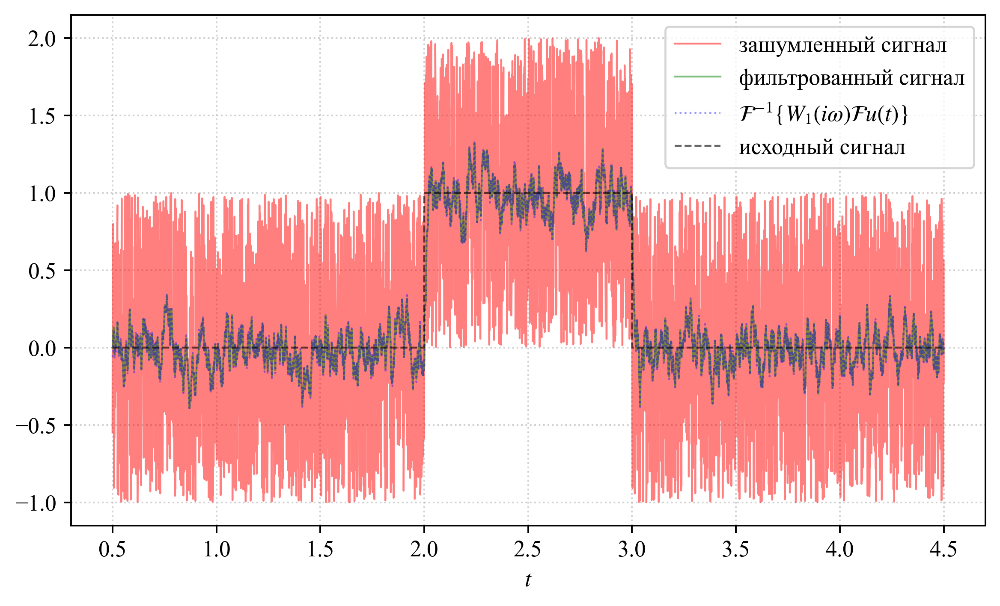

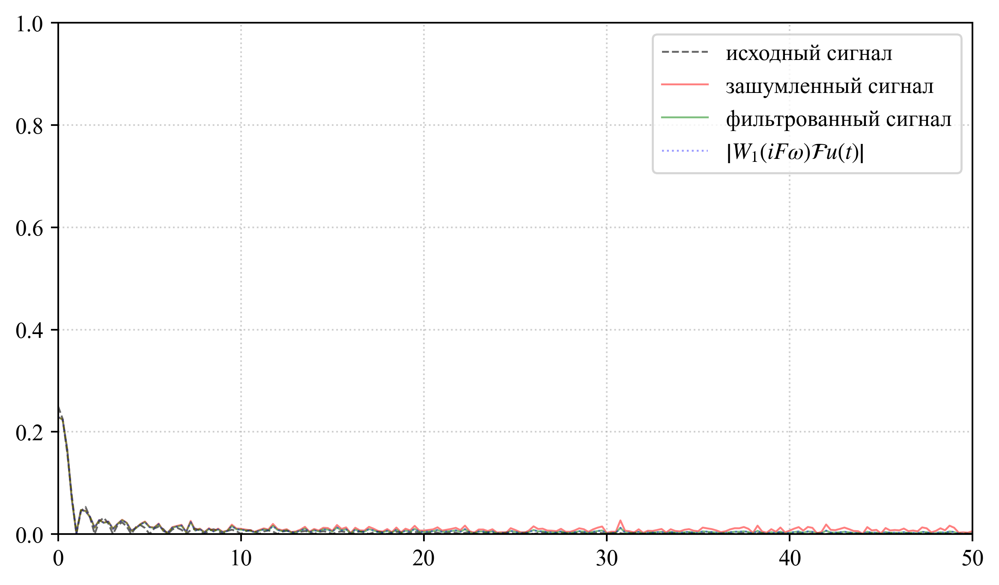

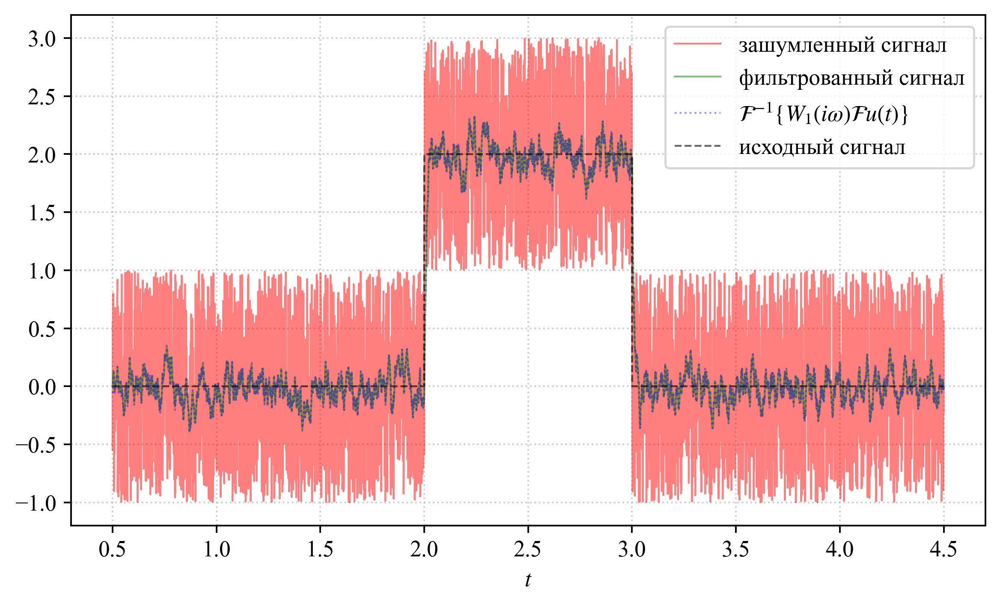

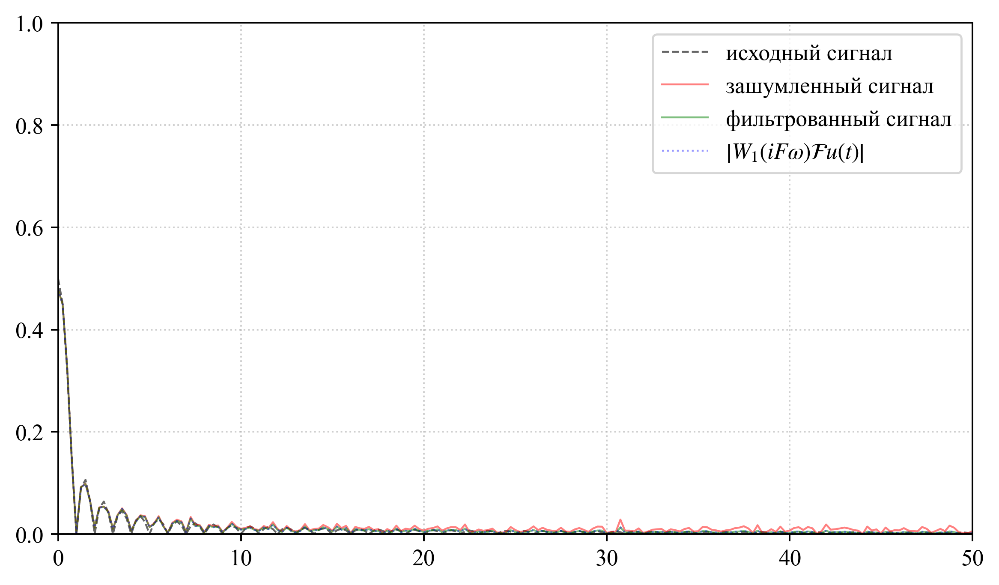

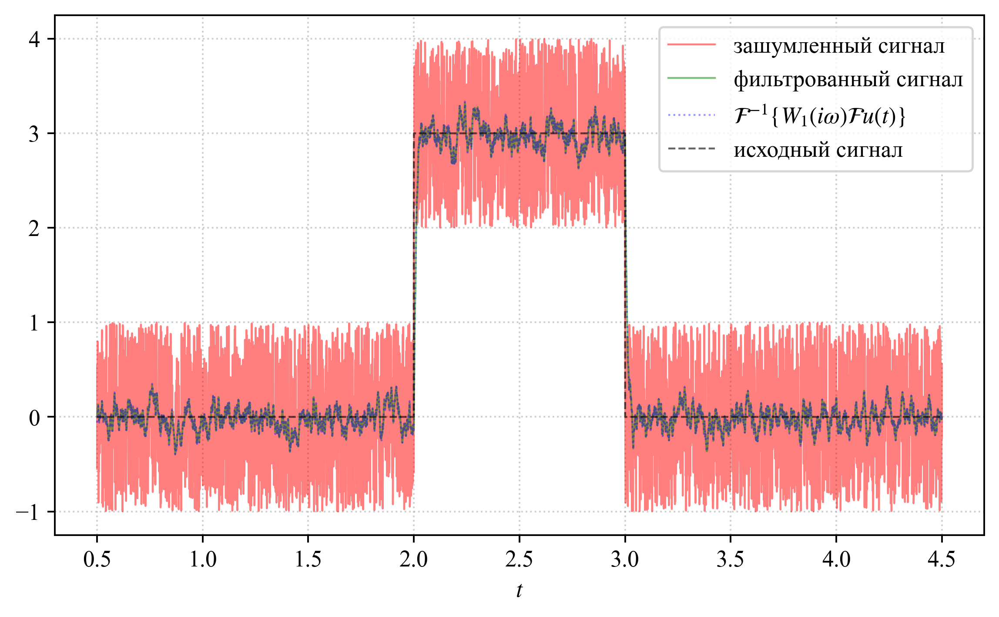

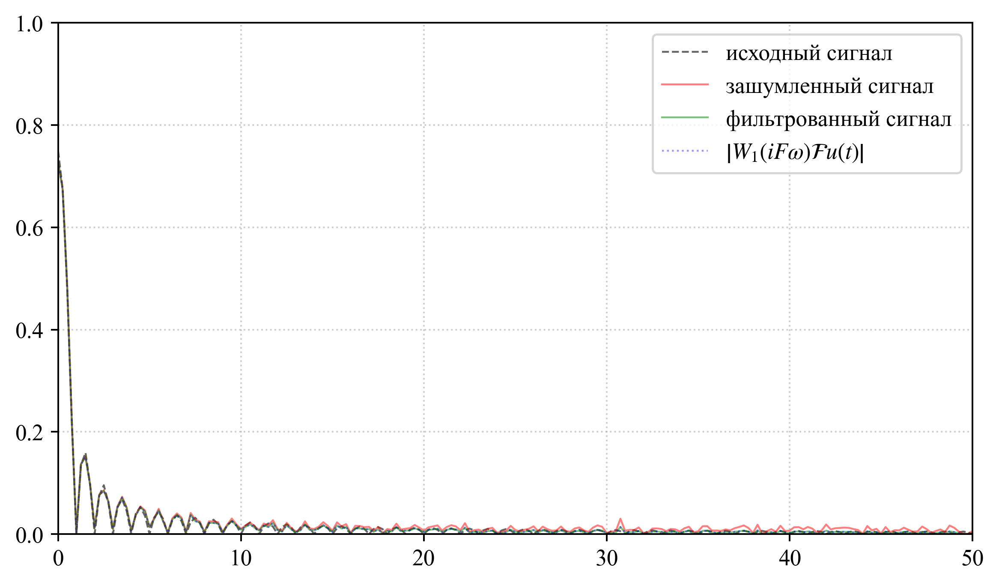

In [8]:
%mkdir -p ../fig/1/1/a/func
%mkdir -p ../fig/1/1/a/conv

noise = xi(t)
w = W1_tf(.01)

for i, a in enumerate((1,2,3), start=3):

    # =======================
    # Сравненение результатов
    # =======================

    plt.figure()

    clean_signal1 = g_(a, 2, 3)(t)
    noisy_signal1 = clean_signal1 + noise

    filtered_fft_dyn = apply_W_dynamic(t, noisy_signal1, w)
    out2 = apply_W_nondynamic(t, noisy_signal1, w)

    plt.plot(t, noisy_signal1, 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(t, filtered_fft_dyn, 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(t, out2, 'b:', alpha=.4, label="$\\mathcal{F}^{-1}\\{W_{1}(i \\omega)\\mathcal{F}u(t)\\}$")
    plt.plot(t, clean_signal1, 'k--', alpha=.6, label='исходный сигнал')
    plt.legend()


    plt.grid(which='major', linestyle=':', alpha=0.6)
    plt.xlabel('$t$')

    plt.savefig(f"../fig/1/1/a/func/{i}.png")

    # ======
    # Образы
    # ======

    plt.figure()

    _clean_signal = clean_signal1
    _noisy_signal = noisy_signal1
    _filtered_signal_dyn = filtered_fft_dyn
    _filtered_signal_nondyn = out2

    clean_fft = np.fft.fft(_clean_signal)[:_clean_signal.size//2] / _clean_signal.size
    noisy_fft = np.fft.fft(_noisy_signal)[:_noisy_signal.size//2] / _noisy_signal.size
    filtered_fft_dyn = np.fft.fft(_filtered_signal_dyn)[:_filtered_signal_dyn.size//2] / _filtered_signal_dyn.size
    filtered_fft_nondyn = np.fft.fft(_filtered_signal_nondyn)[:_filtered_signal_nondyn.size//2] / _filtered_signal_nondyn.size

    freqs = np.fft.fftfreq(_clean_signal.size, t[1] - t[0])[:_clean_signal.size//2]

    plt.plot(freqs, np.abs(clean_fft), 'k--', alpha=.6, label='исходный сигнал')
    plt.plot(freqs, np.abs(noisy_fft), 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(freqs, np.abs(filtered_fft_dyn), 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(freqs, np.abs(filtered_fft_nondyn), 'b:', alpha=.4, label=r'$\left|W_1 (i F\omega) \mathcal{F}u(t)\right|$')

    plt.xlim(0, 50)
    plt.ylim(0, 1)

    plt.grid(which='major', linestyle=':', alpha=0.6)
    plt.legend()

    plt.savefig(f"../fig/1/1/a/conv/{i}.png")

# 1.2

In [9]:
%mkdir -p ../fig/1/2/

noisy_signal1 = noisy_signal(t, 0, 1, 2*np.pi * 20)

In [10]:

def check_roots(b, c):
    D = np.complex128(b**2 - 4*c)
    roots = np.real((-b + np.sqrt(D))/2), np.real((-b - np.sqrt(D))/2)
    return all(map(lambda x: x < 0, roots)), roots

def W2_tf(a1, a2, b1, b2):
    assert check_roots(b1, b2), "Фильтр неустойчивый"

    return W_tf([1, a1, a2], [1, b1, b2])

def W2(a1, a2, b1, b2):
    roots = check_roots(b1, b2)
    assert roots[0], ("Фильтр неустойчивый", roots[1])

    return lambda p: (p**2 + a1*p + a2)/(p**2 + b1*p + b2)


## Влияние b1 на АЧХ

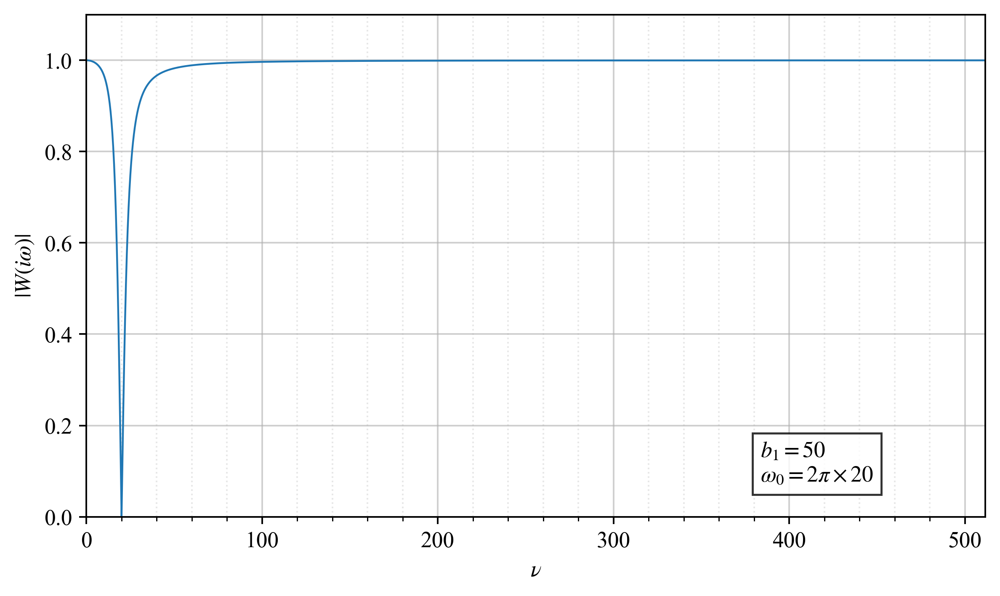

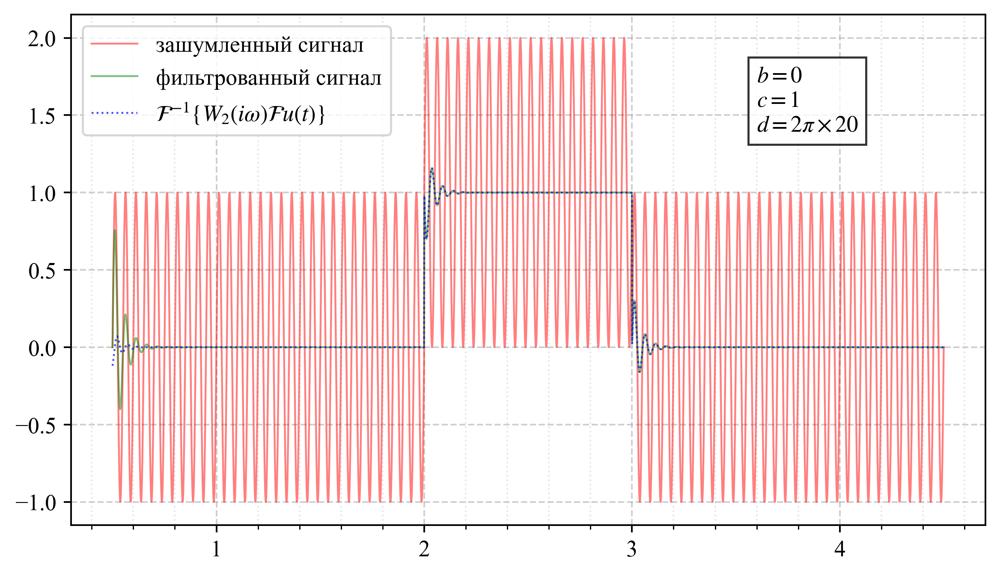

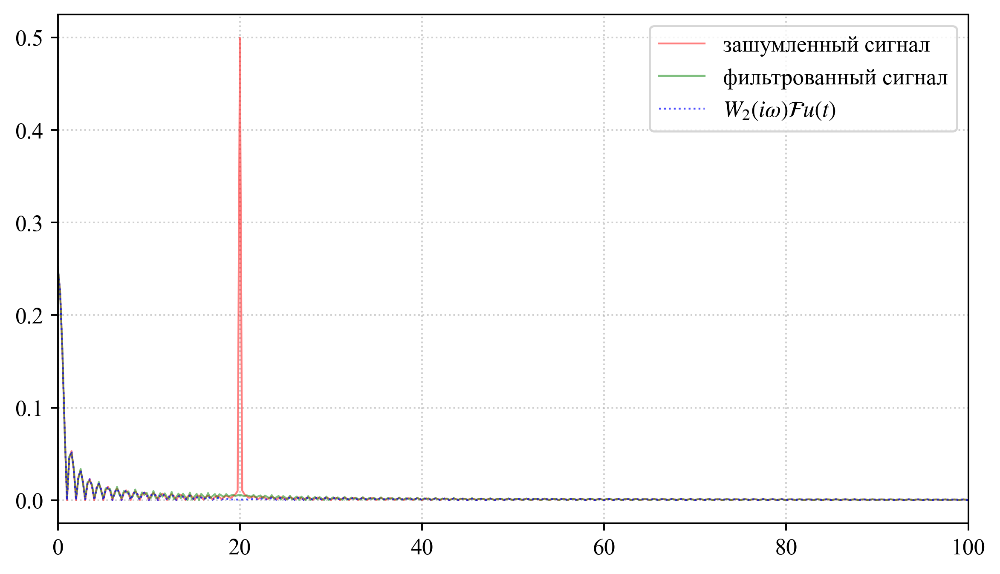

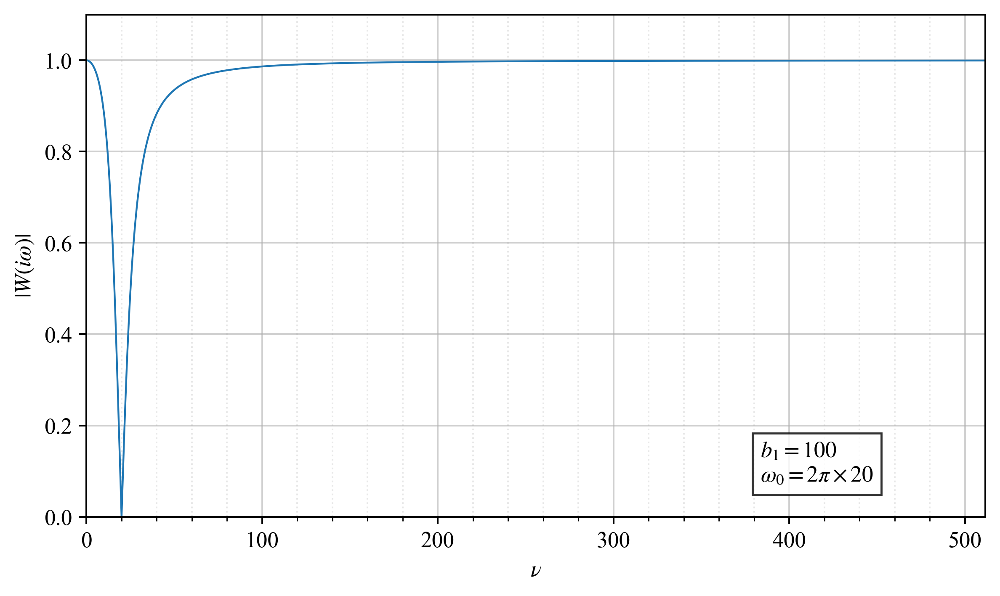

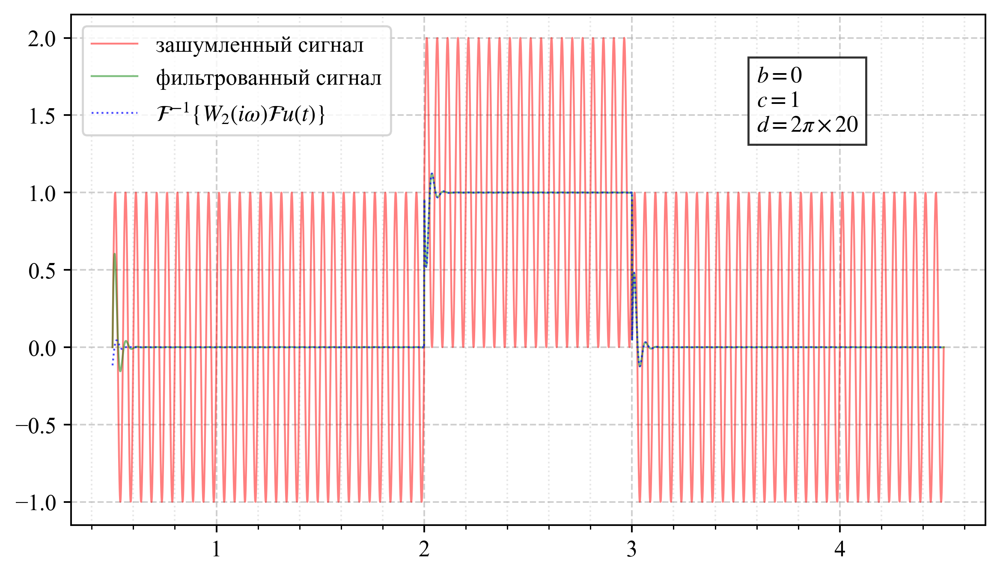

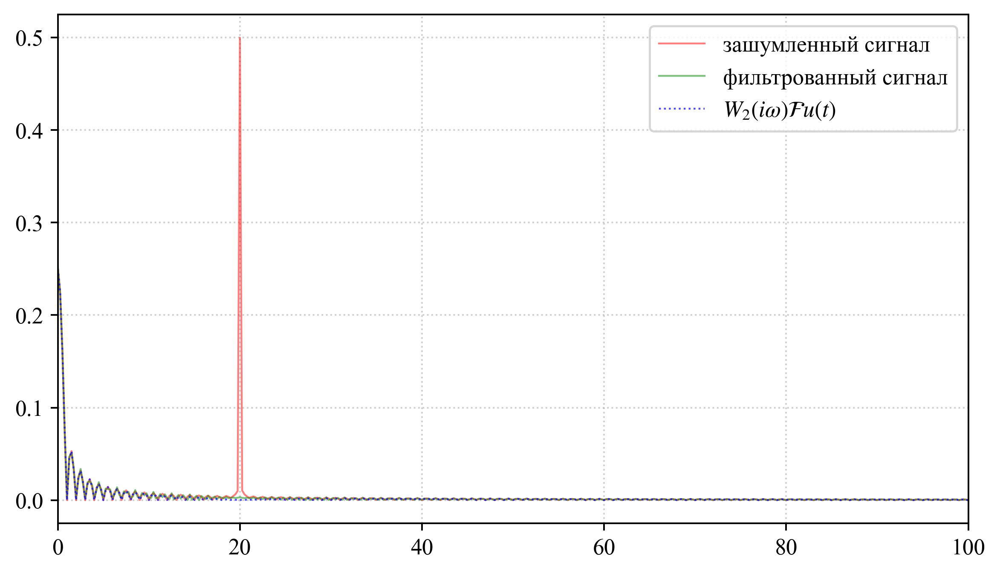

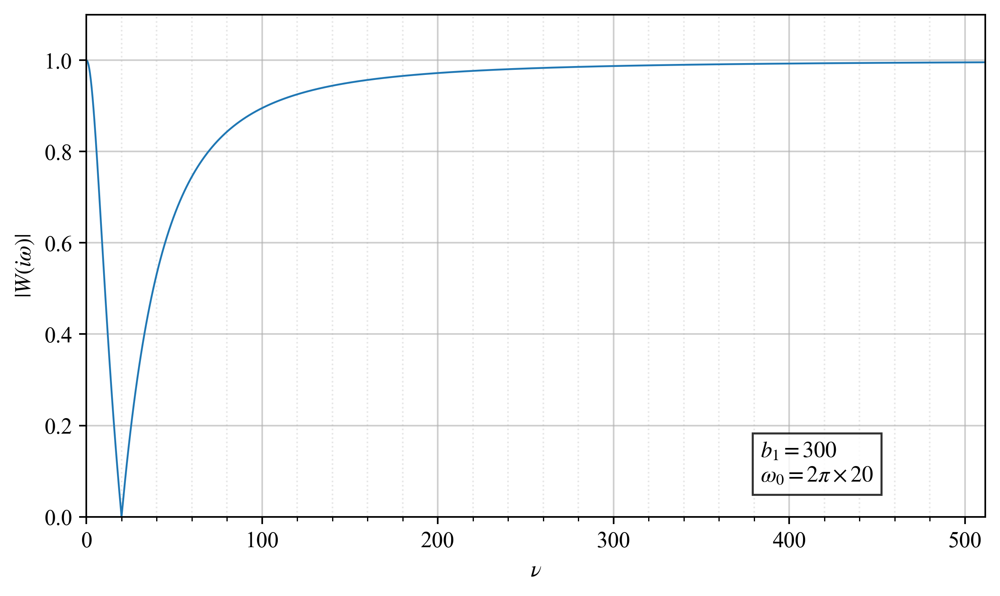

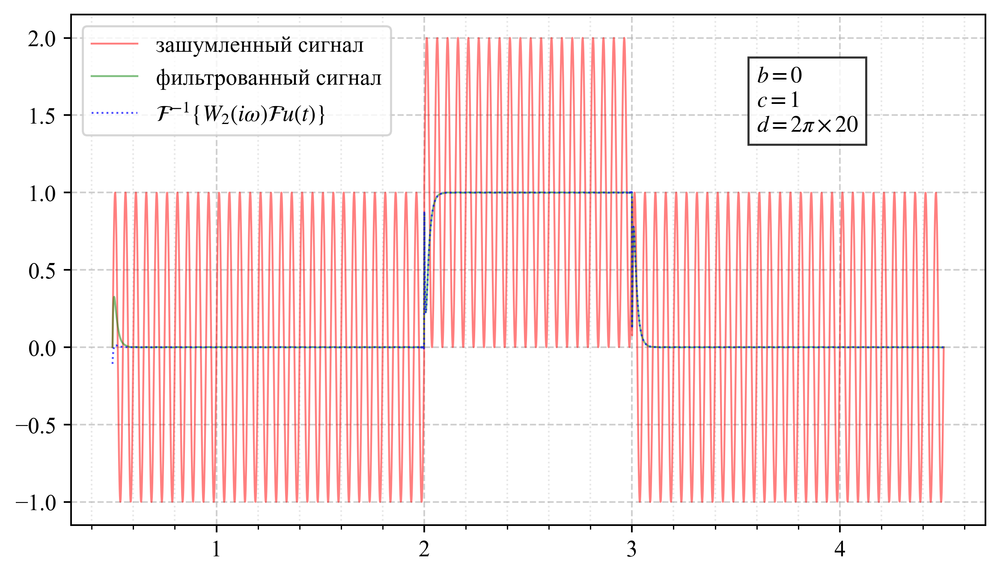

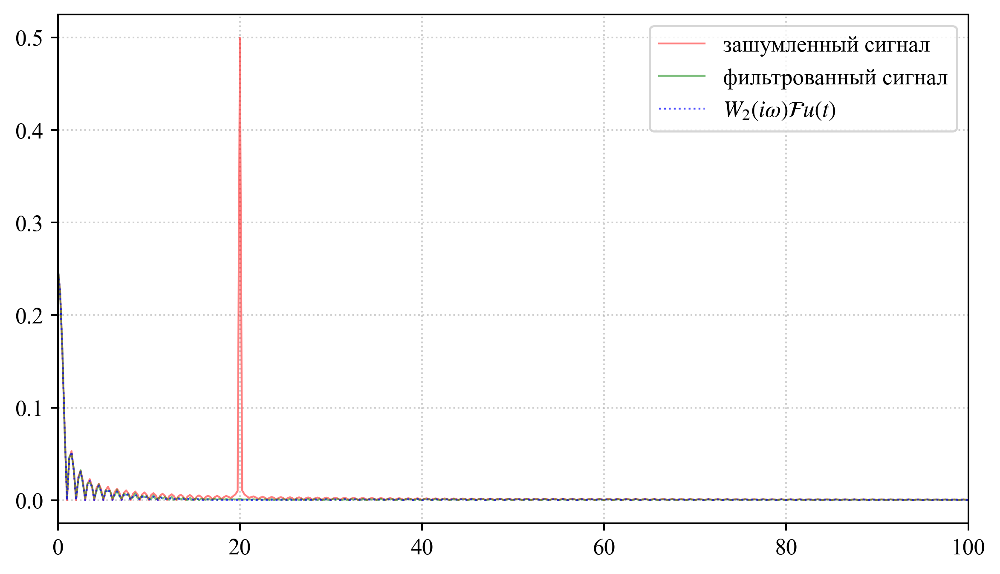

In [11]:
%mkdir -p ../fig/1/2/b1

for i, _b1 in enumerate((50, 10**2, 3*10**2)):
    # -----------------------------------------------
    # АЧХ Фильтра
    # -----------------------------------------------
    plt.figure(num=3*i)
    ax = plt.gca()

    ax.xaxis.set_major_locator(plt.MultipleLocator(100))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(20))
    ax.grid(which='major', linestyle='--', alpha=0.6)
    ax.grid(which='minor', linestyle=':', alpha=0.3)

    ax.set_ylim(top=1.1)

    # См.:
    # https://en.wikipedia.org/wiki/Band-stop_filter

    omega0 = 2*np.pi * 20

    a1 = 0
    a2 = omega0**2
    b1 = _b1
    b2 = omega0**2

    _W = W2_tf(a1, a2, b1, b2)

    ax.text(0.75, 0.15, f"$b_1 = {b1}$\n$\\omega_{0}=2\\pi\\times20$", transform=ax.transAxes, 
             verticalalignment='top', horizontalalignment='left',
             bbox=dict(facecolor='white', alpha=0.8))

    plot_freq_response(_W, ax, t)

    plt.savefig(f"../fig/1/2/b1/{3*i}.png")

    # -----------------------------------------------
    # Cравнение зашумленного и фильтрованного сигнала
    # -----------------------------------------------
    plt.figure(num=3*i+1)
    ax = plt.gca()

    ax.xaxis.set_major_locator(plt.MultipleLocator(1))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(0.2))
    ax.grid(which='major', linestyle='--', alpha=0.6)
    ax.grid(which='minor', linestyle=':', alpha=0.3)

    out_signal = apply_W_dynamic(t, noisy_signal1, _W)
    out_signal2 = apply_W_nondynamic(t, noisy_signal1, _W)

    ax.plot(t, noisy_signal1, 'r-', alpha=.5, label='зашумленный сигнал')
    ax.plot(t, out_signal, 'g-', alpha=.5, label='фильтрованный сигнал')
    ax.plot(t, out_signal2, 'b:', alpha=.7, label="$\\mathcal{F}^{-1}\\{W_{2}(i \\omega)\\mathcal{F}u(t)\\}$")

    ax.text(0.75, 0.90, f"$b=0$\n$c=1$\n$d=2\\pi\\times20$", transform=ax.transAxes, 
             verticalalignment='top', horizontalalignment='left',
             bbox=dict(facecolor='white', alpha=0.8))
    
    ax.legend()

    plt.savefig(f"../fig/1/2/b1/{3*i+1}.png")

    # -----------------------------------------------
    # Cравнение зашумленного и фильтрованного образа
    # -----------------------------------------------
    plt.figure(num=3*i+2)
    ax = plt.gca()

    ax.set_xlim(right=100)

    freqs = np.fft.fftfreq(t.size, t[1] - t[0])[0:t.size//2]

    noisy_fft = np.abs(np.fft.fft(noisy_signal1)[0:t.size//2]) / t.size

    filtered_fft_dyn = np.abs((np.fft.fft(out_signal))[0:t.size//2]) / t.size
    filtered_fft_nondyn = np.abs((np.fft.fft(out_signal2))[0:t.size//2]) / t.size

    plt.plot(freqs, noisy_fft, 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(freqs, filtered_fft_dyn, 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(freqs, filtered_fft_nondyn, 'b:', alpha=.7, label="$W_{2}(i \\omega)\\mathcal{F}u(t)$")


    plt.grid(which='major', linestyle=':', alpha=0.6)

    plt.legend()

    plt.savefig(f"../fig/1/2/b1/{3*i+2}.png")

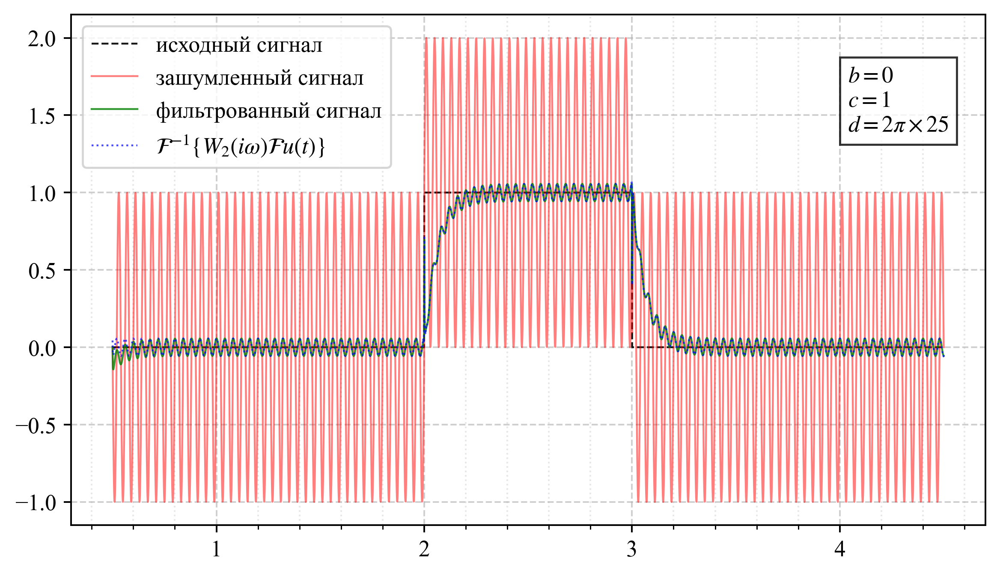

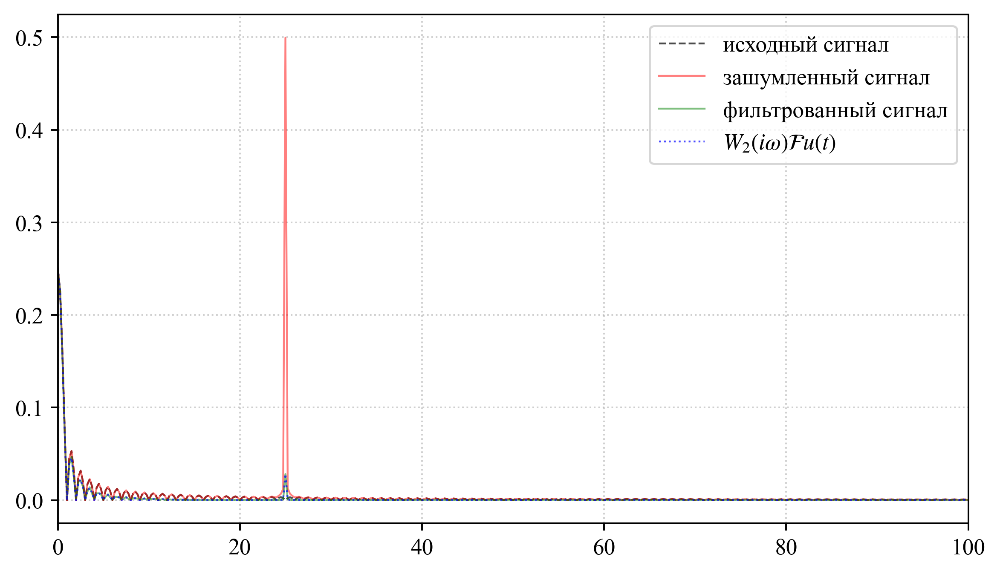

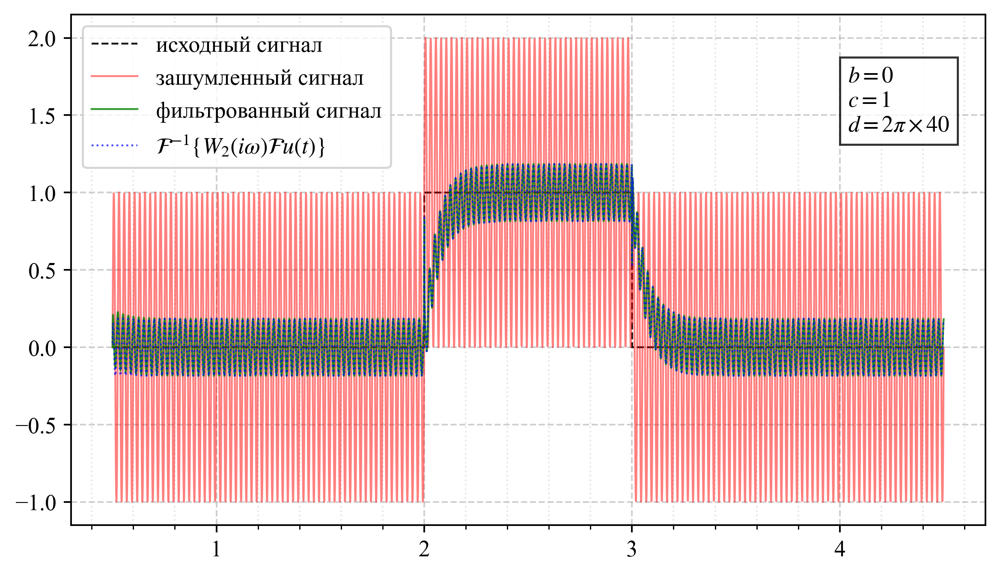

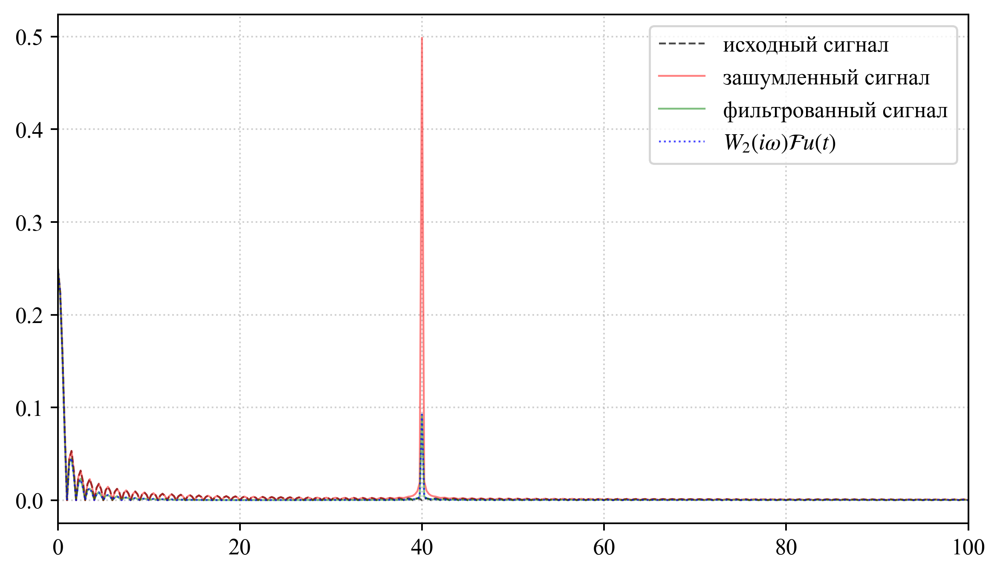

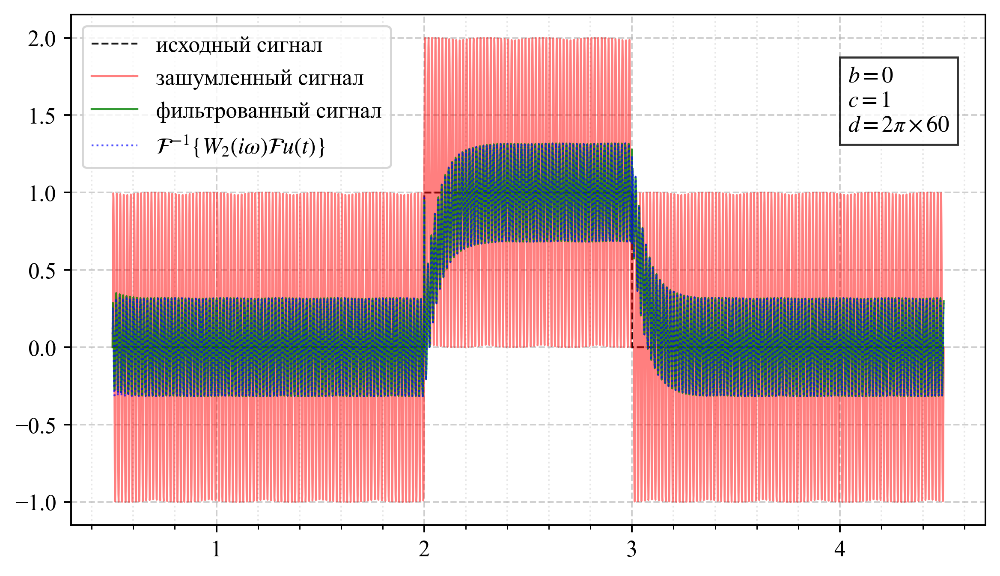

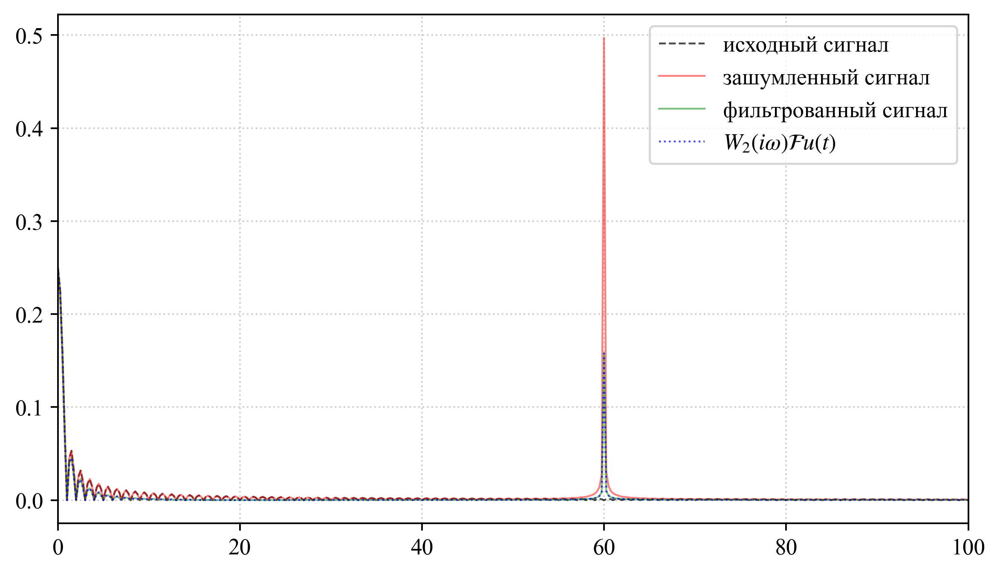

In [12]:
%mkdir -p ../fig/1/2/d

# См.:
# https://en.wikipedia.org/wiki/Band-stop_filter

omega0 = 2*np.pi * 20

a1 = 0
a2 = omega0**2
b1 = 10**3
b2 = omega0**2

_W = W2_tf(a1, a2, b1, b2)


for i, _f0 in enumerate((25, 40, 60)):

    _wave = wave(t, 2*np.pi*_f0)
    _noisy_signal = clean_signal + _wave

    # -----------------------------------------------
    # Cравнение зашумленного и фильтрованного сигнала
    # -----------------------------------------------
    plt.figure(num=2*i)
    ax = plt.gca()

    ax.xaxis.set_major_locator(plt.MultipleLocator(1))
    ax.xaxis.set_minor_locator(plt.MultipleLocator(0.2))
    ax.grid(which='major', linestyle='--', alpha=0.6)
    ax.grid(which='minor', linestyle=':', alpha=0.3)

    out_signal = apply_W_dynamic(t, _noisy_signal, _W)
    out_signal2 = apply_W_nondynamic(t, _noisy_signal, _W)

    ax.plot(t, clean_signal,  'k--', alpha=.9, label='исходный сигнал')
    ax.plot(t, _noisy_signal,  'r-', alpha=.5, label='зашумленный сигнал')
    ax.plot(t, out_signal, 'g-', alpha=.8, label='фильтрованный сигнал')
    ax.plot(t, out_signal2, 'b:', alpha=.7, label="$\\mathcal{F}^{-1}\\{W_{2}(i \\omega)\\mathcal{F}u(t)\\}$")

    ax.text(0.85, 0.90, f"$b=0$\n$c=1$\n$d=2\\pi\\times{_f0}$", transform=ax.transAxes, 
             verticalalignment='top', horizontalalignment='left',
             bbox=dict(facecolor='white', alpha=0.8))

    plt.legend()
    plt.savefig(f"../fig/1/2/d/{2*i}.png")

    # -----------------------------------------------
    # Cравнение зашумленного и фильтрованного образа
    # -----------------------------------------------
    plt.figure(num=2*i+1)
    ax = plt.gca()

    ax.set_xlim(right=100)

    
    freqs = np.fft.fftfreq(t.size, t[1] - t[0])[0:t.size//2]
    noisy_fft = np.abs(np.fft.fft(_noisy_signal)[0:t.size//2]) / t.size
    clean_fft = np.abs(np.fft.fft(clean_signal)[0:t.size//2]) / t.size

    filtered_fft_dyn = np.abs((np.fft.fft(out_signal))[0:t.size//2]) / t.size
    filtered_fft_nondyn = np.abs((np.fft.fft(out_signal2))[0:t.size//2]) / t.size

    plt.plot(freqs, clean_fft, 'k--', alpha=.7, label='исходный сигнал')
    plt.plot(freqs, noisy_fft, 'r-', alpha=.5, label='зашумленный сигнал')
    plt.plot(freqs, filtered_fft_dyn, 'g-', alpha=.5, label='фильтрованный сигнал')
    plt.plot(freqs, filtered_fft_nondyn, 'b:', alpha=.7, label="$W_{2}(i \\omega)\\mathcal{F}u(t)$")

    plt.grid(which='major', linestyle=':', alpha=0.6)

    plt.legend()

    plt.savefig(f"../fig/1/2/d/{2*i+1}.png")

In [13]:
import pandas as pd

frame = pd.read_csv('../sup/data.csv')
frame["Date"] = pd.to_datetime(frame["Date"])
frame["Average"] = (frame['Open']+frame['Close']+frame['High']+frame['Low']) / 4
subset = frame[frame["Date"] > pd.to_datetime("2016-12-31")]


time = dict(
    minute=1,
    hour  =60,
    day   =60*24,
    week  =60*24*7,
    month =60*24*30,
    year  =60*24*365
)

Figure ../fig/2/1.png date range: 2017-01-01 to 2023-02-21


Figure ../fig/2/1.png date range: 2019-01-01 to 2022-01-01


Figure ../fig/2/1.png date range: 2021-01-01 to 2021-07-01


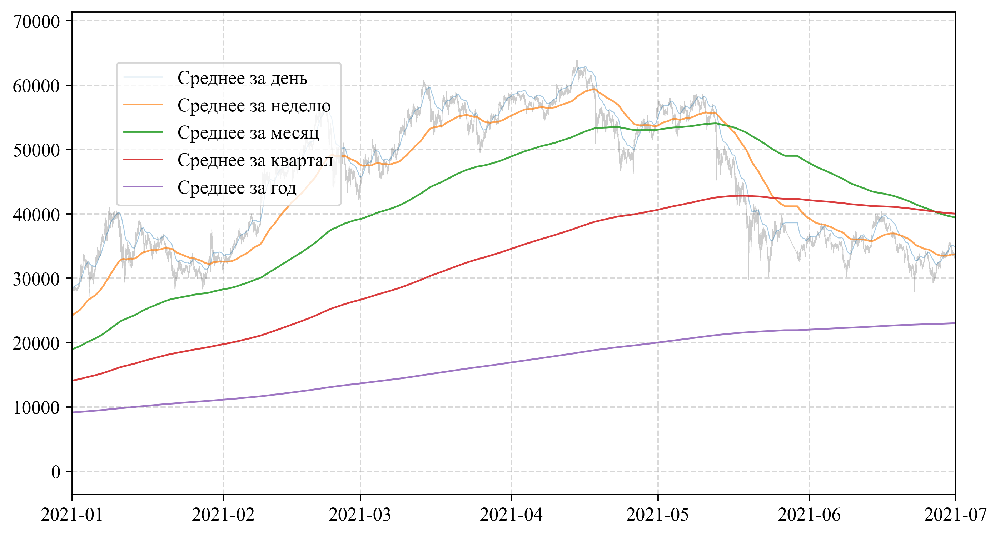

In [14]:
# Исходные данные
average_orig = subset["Average"].to_numpy()
_average_orig = average_orig[::-1]

t = np.arange(0, average_orig.size)

average_day = apply_W_dynamic(t, _average_orig, W1_tf(time['day']), dt=1, y0=_average_orig[0])[::-1]
average_week = apply_W_dynamic(t, _average_orig, W1_tf(time['week']), dt=1, y0=_average_orig[0])[::-1]
average_month = apply_W_dynamic(t, _average_orig, W1_tf(time['month']), dt=1, y0=_average_orig[0])[::-1]
average_quarter = apply_W_dynamic(t, _average_orig, W1_tf(time['month']*3), dt=1, y0=_average_orig[0])[::-1]
average_year = apply_W_dynamic(t, _average_orig, W1_tf(time['year']), dt=1, y0=_average_orig[0])[::-1]


plt.plot(subset['Date'], average_orig, 'k-', linewidth=.4, alpha=.2)

plt.plot(subset['Date'], average_day, '-', linewidth=.5, alpha=.4, label='Среднее за день')
plt.plot(subset['Date'], average_week, '-', linewidth=1, alpha=.7, label='Среднее за неделю')
plt.plot(subset['Date'], average_month, '-', linewidth=1, alpha=.9, label='Среднее за месяц')
plt.plot(subset['Date'], average_quarter, '-', linewidth=1, alpha=.9, label='Среднее за квартал')
plt.plot(subset['Date'], average_year, '-', linewidth=1, alpha=.9, label='Среднее за год')

plt.legend(loc=(.05, .6))

ax = plt.gca()
# ax.xaxis.set_major_locator(mpl.dates.MonthLocator(interval=12))  # каждые 3 месяца – квартал
# ax.xaxis.set_minor_locator(mpl.dates.MonthLocator(interval=3))             # минорные – каждый месяц
# ax.xaxis.set_major_formatter(mpl.dates.DateFormatter('%Y'))


# ax.yaxis.set_major_locator(mpl.ticker.MultipleLocator(10000))
# ax.yaxis.set_minor_locator(mpl.ticker.MultipleLocator(2500))

ax.grid(which='major', linestyle='--', alpha=0.5)
ax.grid(which='minor', linestyle=':', alpha=0.3)

plt.margins(.05)
plt.tight_layout()

start_date = pd.to_datetime("2017-01-01")
end_date = pd.to_datetime("2023-02-21")
ax.set_xlim(start_date, end_date)

%mkdir -p ../fig/2
plt.savefig('../fig/2/1.png')
date_range = mpl.dates.num2date(ax.get_xlim())
print("Figure ../fig/2/1.png date range:", date_range[0].strftime('%Y-%m-%d'), "to", date_range[1].strftime('%Y-%m-%d'))
plt.savefig('../fig/2/1.png')

start_date = pd.to_datetime("2019-01-01")
end_date = pd.to_datetime("2022-01-01")

ax.set_xlim(start_date, end_date)
plt.savefig('../fig/2/2.png')
date_range = mpl.dates.num2date(ax.get_xlim())
print("Figure ../fig/2/1.png date range:", date_range[0].strftime('%Y-%m-%d'), "to", date_range[1].strftime('%Y-%m-%d'))

start_date = pd.to_datetime("2021-01-01")
end_date = pd.to_datetime("2021-07-01")

ax.set_xlim(start_date, end_date)
plt.savefig('../fig/2/3.png')
date_range = mpl.dates.num2date(ax.get_xlim())
print("Figure ../fig/2/1.png date range:", date_range[0].strftime('%Y-%m-%d'), "to", date_range[1].strftime('%Y-%m-%d'))